# **Домашнее задание №1 (base)**

В этом домашнем задании вам будет необходимо:
*  обучить модель регрессии для предсказания стоимости автомобилей;
* реализовать веб-сервис для применения построенной модели на новых данных

**Максимальная оценка за дз**
> Оценка за домашку = $min(\text{ваш балл}, 11)$

**Мягкий дедлайн: 27 ноября 23:59**

**Жесткий дедлайн: 20 декабря 23:59 (конец модуля)**


**Примечание**

В каждой части оцениваются как код, **так и ответы на вопросы.** Вопросы подсвечены синим цветом.

Если нет одного и/или другого, то часть баллов за соответствующее задание снимается.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
import seaborn as sns

random.seed(42)
np.random.seed(42)

**Задание 0 (0 баллов).**
Для чего фиксируем сиды в домашках?

Для воспроизводимости

# **Часть 1 | EDA и визуализация**

Первая часть состоит из классических шагов EDA:

- Базовый EDA и обработка признаков (2.5 балла)
- Визуализации признаков и их анализ (1 балл)

Всего можно набрать 3.5 основных балла и 0.65 бонусных. Бонусные задания выделены как **Дополнительное задание/Бонус**. Вы можете выполнять их, чтобы в случае ошибок в основных задачах всё равно набрать за работу максимум. Кроме того, дополнительные задания позволяют вам углубить знания.

Призываем активно использовать их!

## **Простейший EDA и обработка признаков (2.5 балла)**

In [2]:
df_train = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_train.csv')
df_test = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_test.csv')

print("Train data shape:", df_train.shape)
print("Test data shape: ", df_test.shape)

Train data shape: (6999, 13)
Test data shape:  (1000, 13)


### **Задание 1 (0.55 балла)**

Выполните операции, направленные на практику основных действий с `pandas`:
- [ ] Отобразите 10 случайных строк тренировочного датасета (0.15 балла)
- [ ] Отобразите первые 5 и последние 5 объектов тестового датасета (0.1 балла)
- [ ] Посмотрите, есть ли в датасете пропуски. Запишите/выведите названия колонок, для которых есть пропущенные значения (0.1 балла)
- [ ] Посмотрите, есть ли в данных явные дубликаты (0.05 балла)


**Бонус**
- [ ] Постройте дашборд, используя [ydata-profilling](https://github.com/ydataai/ydata-profiling)(0.15 балла)

In [ ]:
pip install ydata-profiling

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 390.6/390.6 kB 15.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 18.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 35.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 6.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 81.5 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=71bb6a98baecf1c0680abc8bc0d97083156e142f35b31d10b562405da98c67e3
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin


In [ ]:
from ydata_profiling import ProfileReport

In [ ]:
profile_train = ProfileReport(df_train, title="Train dash", explorative=True)

In [ ]:
profile_train.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
profile_test = ProfileReport(df_test, title="Test dash", explorative=True)

In [ ]:
profile_test.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [3]:
df_train.sample(n=10)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
6565,Renault KWID Climber 1.0 MT BSIV,2019,300000,35000,Petrol,Individual,Manual,First Owner,23.01 kmpl,999 CC,67 bhp,91Nm@ 4250rpm,5.0
2943,Maruti Wagon R LXI,2013,225000,58343,Petrol,Trustmark Dealer,Manual,First Owner,21.79 kmpl,998 CC,67.05 bhp,90Nm@ 3500rpm,5.0
2024,Hyundai i20 Asta 1.2,2013,360000,30000,Petrol,Individual,Manual,First Owner,18.5 kmpl,1197 CC,82.85 bhp,113.7Nm@ 4000rpm,5.0
263,Hyundai i20 1.2 Asta,2010,300000,70000,Petrol,Individual,Manual,First Owner,17.0 kmpl,1197 CC,80 bhp,"11.4 kgm at 4,000 rpm",5.0
4586,Skoda Octavia L and K 1.9 TDI MT,2005,250000,120000,Diesel,Individual,Manual,Third Owner,16.4 kmpl,1896 CC,90 bhp,"21.4@ 1,900(kgm@ rpm)",5.0
4479,Maruti Ciaz ZXi,2016,700000,20000,Petrol,Individual,Manual,First Owner,20.73 kmpl,1373 CC,91.1 bhp,130Nm@ 4000rpm,5.0
4881,Hyundai Grand i10 1.2 Kappa Magna BSIV,2017,445000,27000,Petrol,Individual,Manual,First Owner,18.9 kmpl,1197 CC,81.86 bhp,113.75nm@ 4000rpm,5.0
3583,Ford Ecosport 1.5 DV5 MT Trend,2016,515000,68609,Diesel,Dealer,Manual,First Owner,22.7 kmpl,1498 CC,89.84 bhp,204Nm@ 2000-2750rpm,5.0
6361,Hyundai Verna 1.4 VTVT,2014,500000,33400,Petrol,Individual,Manual,First Owner,17.43 kmpl,1396 CC,105.5 bhp,135.3Nm@ 5000rpm,5.0
4108,Hyundai i20 Era 1.2,2015,490000,45900,Petrol,Individual,Manual,Second Owner,18.6 kmpl,1197 CC,81.83 bhp,114.7Nm@ 4000rpm,5.0


In [4]:
df_train.iloc[0]

,0
name,Maruti Swift Dzire VDI
year,2014
selling_price,450000
km_driven,145500
fuel,Diesel
seller_type,Individual
transmission,Manual
owner,First Owner
mileage,23.4 kmpl
engine,1248 CC


In [5]:
df_test.head(5)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Mahindra Xylo E4 BS IV,2010,229999,168000,Diesel,Individual,Manual,First Owner,14.0 kmpl,2498 CC,112 bhp,260 Nm at 1800-2200 rpm,7.0
1,Tata Nexon 1.5 Revotorq XE,2017,665000,25000,Diesel,Individual,Manual,First Owner,21.5 kmpl,1497 CC,108.5 bhp,260Nm@ 1500-2750rpm,5.0
2,Honda Civic 1.8 S AT,2007,175000,218463,Petrol,Individual,Automatic,First Owner,12.9 kmpl,1799 CC,130 bhp,172Nm@ 4300rpm,5.0
3,Honda City i DTEC VX,2015,635000,173000,Diesel,Individual,Manual,First Owner,25.1 kmpl,1498 CC,98.6 bhp,200Nm@ 1750rpm,5.0
4,Tata Indica Vista Aura 1.2 Safire BSIV,2011,130000,70000,Petrol,Individual,Manual,Second Owner,16.5 kmpl,1172 CC,65 bhp,96 Nm at 3000 rpm,5.0


In [6]:
df_test.tail(5)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
995,Hyundai i10 Magna 1.1L,2008,250000,100000,Petrol,Individual,Manual,Second Owner,19.81 kmpl,1086 CC,68.05 bhp,99.04Nm@ 4500rpm,5.0
996,Hyundai i20 2015-2017 Sportz 1.2,2017,440000,50000,Petrol,Individual,Manual,Second Owner,18.6 kmpl,1197 CC,81.83 bhp,114.7Nm@ 4000rpm,5.0
997,Hyundai i20 Era Diesel,2009,340000,40000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
998,Hyundai i10 Asta,2012,350000,25000,Petrol,Individual,Manual,First Owner,20.36 kmpl,1197 CC,78.9 bhp,111.8Nm@ 4000rpm,5.0
999,Honda City i DTec SV,2016,700000,110000,Diesel,Individual,Manual,First Owner,26.0 kmpl,1498 CC,98.6 bhp,200Nm@ 1750rpm,5.0


In [7]:
df_train.describe(include='all')

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
count,6999,6999.000000,6.999000e+03,6.999000e+03,6999,6999,6999,6999,6797,6797,6803,6796,6797.000000
unique,1924,NaN,NaN,NaN,4,3,2,5,386,120,316,419,NaN
top,Maruti Swift Dzire VDI,NaN,NaN,NaN,Diesel,Individual,Manual,First Owner,18.9 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,NaN
freq,116,NaN,NaN,NaN,3793,5826,6095,4587,197,885,330,468,NaN
mean,NaN,2013.818403,6.395152e+05,6.958462e+04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.419008
std,NaN,4.053095,8.089419e+05,5.772400e+04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.965767
min,NaN,1983.000000,2.999900e+04,1.000000e+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.000000
25%,NaN,2011.000000,2.549990e+05,3.500000e+04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.000000
50%,NaN,2015.000000,4.500000e+05,6.000000e+04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.000000
75%,NaN,2017.000000,6.750000e+05,9.700000e+04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.000000


In [8]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6999 entries, 0 to 6998
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           6999 non-null   object 
 1   year           6999 non-null   int64  
 2   selling_price  6999 non-null   int64  
 3   km_driven      6999 non-null   int64  
 4   fuel           6999 non-null   object 
 5   seller_type    6999 non-null   object 
 6   transmission   6999 non-null   object 
 7   owner          6999 non-null   object 
 8   mileage        6797 non-null   object 
 9   engine         6797 non-null   object 
 10  max_power      6803 non-null   object 
 11  torque         6796 non-null   object 
 12  seats          6797 non-null   float64
dtypes: float64(1), int64(3), object(9)
memory usage: 711.0+ KB


In [9]:
df_train.isnull().sum()

,0
name,0
year,0
selling_price,0
km_driven,0
fuel,0
seller_type,0
transmission,0
owner,0
mileage,202
engine,202


In [10]:
df_test.isnull().sum()

,0
name,0
year,0
selling_price,0
km_driven,0
fuel,0
seller_type,0
transmission,0
owner,0
mileage,19
engine,19


Мы обнаружили пропуски. Давайте избавимся от них.

- [ ] Заполните пропуски в столбцах медианами. Убедитесь, что после заполнения пропусков не осталось. Заполнение пропусков проводите для обоих наборов данных, если необходимо

**Важно!**

При заполнении пропусков и в тестовом, и тренировочном наборах данных вы определяетесь со стратегией предобработки пропущенных значений при потенциальной работе модели.

Так как в теоретическом случае вы не имеете доступа к тестовой выборке, то заполняемой значение (у нас — медиана) вы считаете про *тренировочному* набору данных и им же заполняете *тестовый*.

In [11]:
problem_columns = ['mileage', 'engine', 'max_power']

In [12]:
#df_train
for col in problem_columns:

    df_train[col] = (
        df_train[col]
        .astype(str)
        .str.replace(r'[^\d.]', '', regex=True)
        .str.replace(r'\.(?=.*\.)', '', regex=True))

for col in problem_columns:
    df_train[col] = pd.to_numeric(df_train[col], errors='coerce', downcast='float')

df_train[problem_columns] = df_train[problem_columns].apply(
    lambda col: col.fillna(col.median()) if np.issubdtype(col.dtype, np.number) else col)

In [13]:
df_train['torque'] = df_train['torque'].str.extract(r'(\d+)')
df_train['torque'] = pd.to_numeric(df_train['torque'], errors='coerce')
df_train['torque'] = df_train['torque'].fillna(df_train['torque'].median())

df_train['seats'] = pd.to_numeric(df_train['seats'], errors='coerce')
df_train['seats'] = df_train['seats'].fillna(df_train['seats'].median())

In [14]:
df_train

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.400000,1248.0,74.000000,190.0,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.139999,1498.0,103.519997,250.0,5.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.000000,1396.0,90.000000,22.0,5.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.100000,1298.0,88.199997,11.0,5.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.139999,1197.0,81.860001,113.0,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6994,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.500000,1197.0,82.849998,113.0,5.0
6995,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.799999,1493.0,110.000000,24.0,5.0
6996,Maruti Swift Dzire ZDi,2009,382000,120000,Diesel,Individual,Manual,First Owner,19.299999,1248.0,73.900002,190.0,5.0
6997,Tata Indigo CR4,2013,290000,25000,Diesel,Individual,Manual,First Owner,23.570000,1396.0,70.000000,140.0,5.0


In [15]:
#df_test
for col in problem_columns:

    df_test[col] = (
        df_test[col]
        .astype(str)
        .str.replace(r'[^\d.]', '', regex=True)
        .str.replace(r'\.(?=.*\.)', '', regex=True))

for col in problem_columns:
    df_test[col] = pd.to_numeric(df_test[col], errors='coerce', downcast='float')

df_test[problem_columns] = df_test[problem_columns].apply(
    lambda col: col.fillna(col.median()) if np.issubdtype(col.dtype, np.number) else col)

In [16]:
df_test['torque'] = df_test['torque'].str.extract(r'(\d+)')
df_test['torque'] = pd.to_numeric(df_test['torque'], errors='coerce')
df_test['torque'] = df_test['torque'].fillna(df_test['torque'].median())

df_test['seats'] = pd.to_numeric(df_test['seats'], errors='coerce')
df_test['seats'] = df_test['seats'].fillna(df_test['seats'].median())

In [17]:
df_test

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Mahindra Xylo E4 BS IV,2010,229999,168000,Diesel,Individual,Manual,First Owner,14.000000,2498.0,112.000000,260.0,7.0
1,Tata Nexon 1.5 Revotorq XE,2017,665000,25000,Diesel,Individual,Manual,First Owner,21.500000,1497.0,108.500000,260.0,5.0
2,Honda Civic 1.8 S AT,2007,175000,218463,Petrol,Individual,Automatic,First Owner,12.900000,1799.0,130.000000,172.0,5.0
3,Honda City i DTEC VX,2015,635000,173000,Diesel,Individual,Manual,First Owner,25.100000,1498.0,98.599998,200.0,5.0
4,Tata Indica Vista Aura 1.2 Safire BSIV,2011,130000,70000,Petrol,Individual,Manual,Second Owner,16.500000,1172.0,65.000000,96.0,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,Hyundai i10 Magna 1.1L,2008,250000,100000,Petrol,Individual,Manual,Second Owner,19.809999,1086.0,68.050003,99.0,5.0
996,Hyundai i20 2015-2017 Sportz 1.2,2017,440000,50000,Petrol,Individual,Manual,Second Owner,18.600000,1197.0,81.830002,114.0,5.0
997,Hyundai i20 Era Diesel,2009,340000,40000,Diesel,Individual,Manual,First Owner,23.000000,1396.0,90.000000,22.0,5.0
998,Hyundai i10 Asta,2012,350000,25000,Petrol,Individual,Manual,First Owner,20.360001,1197.0,78.900002,111.0,5.0


In [18]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6999 entries, 0 to 6998
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           6999 non-null   object 
 1   year           6999 non-null   int64  
 2   selling_price  6999 non-null   int64  
 3   km_driven      6999 non-null   int64  
 4   fuel           6999 non-null   object 
 5   seller_type    6999 non-null   object 
 6   transmission   6999 non-null   object 
 7   owner          6999 non-null   object 
 8   mileage        6999 non-null   float32
 9   engine         6999 non-null   float32
 10  max_power      6999 non-null   float32
 11  torque         6999 non-null   float64
 12  seats          6999 non-null   float64
dtypes: float32(3), float64(2), int64(3), object(5)
memory usage: 628.9+ KB


In [19]:
df_test

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Mahindra Xylo E4 BS IV,2010,229999,168000,Diesel,Individual,Manual,First Owner,14.000000,2498.0,112.000000,260.0,7.0
1,Tata Nexon 1.5 Revotorq XE,2017,665000,25000,Diesel,Individual,Manual,First Owner,21.500000,1497.0,108.500000,260.0,5.0
2,Honda Civic 1.8 S AT,2007,175000,218463,Petrol,Individual,Automatic,First Owner,12.900000,1799.0,130.000000,172.0,5.0
3,Honda City i DTEC VX,2015,635000,173000,Diesel,Individual,Manual,First Owner,25.100000,1498.0,98.599998,200.0,5.0
4,Tata Indica Vista Aura 1.2 Safire BSIV,2011,130000,70000,Petrol,Individual,Manual,Second Owner,16.500000,1172.0,65.000000,96.0,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,Hyundai i10 Magna 1.1L,2008,250000,100000,Petrol,Individual,Manual,Second Owner,19.809999,1086.0,68.050003,99.0,5.0
996,Hyundai i20 2015-2017 Sportz 1.2,2017,440000,50000,Petrol,Individual,Manual,Second Owner,18.600000,1197.0,81.830002,114.0,5.0
997,Hyundai i20 Era Diesel,2009,340000,40000,Diesel,Individual,Manual,First Owner,23.000000,1396.0,90.000000,22.0,5.0
998,Hyundai i10 Asta,2012,350000,25000,Petrol,Individual,Manual,First Owner,20.360001,1197.0,78.900002,111.0,5.0


In [20]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           1000 non-null   object 
 1   year           1000 non-null   int64  
 2   selling_price  1000 non-null   int64  
 3   km_driven      1000 non-null   int64  
 4   fuel           1000 non-null   object 
 5   seller_type    1000 non-null   object 
 6   transmission   1000 non-null   object 
 7   owner          1000 non-null   object 
 8   mileage        1000 non-null   float32
 9   engine         1000 non-null   float32
 10  max_power      1000 non-null   float32
 11  torque         1000 non-null   float64
 12  seats          1000 non-null   float64
dtypes: float32(3), float64(2), int64(3), object(5)
memory usage: 90.0+ KB


### **Задание 2 (0.5 балла)**

- [ ] Посмотрите, есть ли в трейне объекты с одинаковым признаковым описанием (целевую переменную следует исключить). Если есть, то сколько? (0.1 балла)
- [ ] Отобразите такие объекты (0.15 балла)
- [ ] Удалите повторяющиеся строки. Если при одинаковом признаковом описании цены на автомобили отличаются, то оставьте первую строку по этому автомобилю (0.15 балла)
- [ ]  Обновите индексы строк таким образом, чтобы они шли от 0 без пропусков (0.1 балла)


In [21]:
subset = df_train.columns.drop('selling_price')
duplicates = df_train.duplicated(subset=subset, keep=False)

In [22]:
duplicates.sum()

1799

In [23]:
df_train[duplicates]

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
22,Maruti Baleno Delta 1.2,2016,575000,45000,Petrol,Individual,Manual,First Owner,21.400000,1197.0,83.099998,115.0,5.0
26,Maruti Omni E MPI STD BS IV,2018,254999,25000,Petrol,Individual,Manual,First Owner,16.799999,796.0,34.200001,59.0,8.0
27,Maruti Vitara Brezza LDi Option,2017,670000,70000,Diesel,Individual,Manual,First Owner,24.299999,1248.0,88.500000,200.0,5.0
28,Fiat Palio 1.2 ELX,2003,70000,50000,Petrol,Individual,Manual,Second Owner,19.299999,1248.0,82.000000,160.0,5.0
29,Maruti Omni 8 Seater BSIV,2012,150000,35000,Petrol,Individual,Manual,Second Owner,14.000000,796.0,35.000000,6.0,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6981,Ford Freestyle Titanium Plus Diesel BSIV,2018,750000,24000,Diesel,Individual,Manual,First Owner,24.400000,1498.0,98.629997,215.0,5.0
6984,Ford Freestyle Titanium Plus Diesel BSIV,2018,746000,24000,Diesel,Individual,Manual,First Owner,24.400000,1498.0,98.629997,215.0,5.0
6989,Maruti Swift Dzire VDI,2015,625000,50000,Diesel,Individual,Manual,First Owner,26.590000,1248.0,74.000000,190.0,5.0
6997,Tata Indigo CR4,2013,290000,25000,Diesel,Individual,Manual,First Owner,23.570000,1396.0,70.000000,140.0,5.0


In [24]:
df_train = df_train.drop_duplicates()

In [25]:
df_train.reset_index(drop=True)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.400000,1248.0,74.000000,190.0,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.139999,1498.0,103.519997,250.0,5.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.000000,1396.0,90.000000,22.0,5.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.100000,1298.0,88.199997,11.0,5.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.139999,1197.0,81.860001,113.0,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6009,Hyundai Santro Xing GLS,2008,120000,191000,Petrol,Individual,Manual,First Owner,17.920000,1086.0,62.099998,96.0,5.0
6010,Maruti Wagon R VXI BS IV with ABS,2013,260000,50000,Petrol,Individual,Manual,Second Owner,18.900000,998.0,67.099998,90.0,5.0
6011,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.500000,1197.0,82.849998,113.0,5.0
6012,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.799999,1493.0,110.000000,24.0,5.0


Отлично! Мы избавились от маленьких и явных проблем. Теперь перейдем к более сложным недостаткам полученной таблицы.

### **Задание 3 (0.25 балла)**

Вы могли заметить, что с признаками ``mileage, engine, max_power и torque`` всё не очень хорошо. Они распознаются как строки (можно убедиться в этом, вызвав `data.dtypes`). Однако эти переменные не являются категориальными — они — числа. Соответственно, нужно привести их к числовому виду.

**Задача :**
* [ ] Уберите единицы измерения для признаков ``mileage, engine, max_power``.
* [ ] Приведите тип данных к ``float``.
* [ ] Удалите столбец ``torque``


**Важно**
- Все действия нужно производить над обоими датасетами — `train` и `test`.
- Стобец ``torque`` мы удаляем для простоты. В идеальном случае, его также стоило бы предобработать.

In [26]:
# Эээм, получается, что уже сделано
df_train.dtypes

,0
name,object
year,int64
selling_price,int64
km_driven,int64
fuel,object
seller_type,object
transmission,object
owner,object
mileage,float32
engine,float32


In [27]:
df_test.dtypes

,0
name,object
year,int64
selling_price,int64
km_driven,int64
fuel,object
seller_type,object
transmission,object
owner,object
mileage,float32
engine,float32


In [28]:
df_train.drop('torque', axis='columns')
df_test.drop('torque', axis='columns')

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats
0,Mahindra Xylo E4 BS IV,2010,229999,168000,Diesel,Individual,Manual,First Owner,14.000000,2498.0,112.000000,7.0
1,Tata Nexon 1.5 Revotorq XE,2017,665000,25000,Diesel,Individual,Manual,First Owner,21.500000,1497.0,108.500000,5.0
2,Honda Civic 1.8 S AT,2007,175000,218463,Petrol,Individual,Automatic,First Owner,12.900000,1799.0,130.000000,5.0
3,Honda City i DTEC VX,2015,635000,173000,Diesel,Individual,Manual,First Owner,25.100000,1498.0,98.599998,5.0
4,Tata Indica Vista Aura 1.2 Safire BSIV,2011,130000,70000,Petrol,Individual,Manual,Second Owner,16.500000,1172.0,65.000000,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...
995,Hyundai i10 Magna 1.1L,2008,250000,100000,Petrol,Individual,Manual,Second Owner,19.809999,1086.0,68.050003,5.0
996,Hyundai i20 2015-2017 Sportz 1.2,2017,440000,50000,Petrol,Individual,Manual,Second Owner,18.600000,1197.0,81.830002,5.0
997,Hyundai i20 Era Diesel,2009,340000,40000,Diesel,Individual,Manual,First Owner,23.000000,1396.0,90.000000,5.0
998,Hyundai i10 Asta,2012,350000,25000,Petrol,Individual,Manual,First Owner,20.360001,1197.0,78.900002,5.0


### **Задание 4 (0.1 балла)**

Теперь, когда не осталось пропусков, давайте преобразуем столбцы к более подходящим типам. А именно столбцы ``engnine`` и ``seats`` к приведем к `int`.

- [ ] Осуществите приведение столбцов к необходимому типу.

In [29]:
df_train = df_train.astype({'engine': int, 'seats': int})

In [30]:
df_train.dtypes

,0
name,object
year,int64
selling_price,int64
km_driven,int64
fuel,object
seller_type,object
transmission,object
owner,object
mileage,float32
engine,int64


### **Задание 5 (0.1 балла)**

Отлично! Мы провели "косметическую" предобработку и теперь готовы сделать важный шаг в контексте анализа данных. А именно — посмотреть на статистики!

**Ваша задача:**
- [ ] Посчитайте основные статистики по числовым столбцам для трейна и теста
- [ ] Посчитайте основные статистики по категориальным столбцам для трейна и теста

**Подсказка:**

Используте ``.describe()`` с нужным(и) аргументом(-ами).

**Примечание:**

Более корректно рассматривать статистики до заполнения пропусков и после, чтобы убедиться, что мы не внесли каких-либо серьезных сдвигов в изначальные рапсределения.

In [31]:
df_train.describe()

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats
count,6014.000000,6.014000e+03,6.014000e+03,6014.000000,6014.000000,6014.000000,6014.000000,6014.000000
mean,2013.447456,5.219820e+05,7.376415e+04,19.471521,1425.702694,87.686531,161.264383,5.423844
std,4.079920,5.338426e+05,5.961075e+04,3.985054,484.728537,31.553036,90.858188,0.978959
min,1983.000000,2.999900e+04,1.000000e+00,0.000000,624.000000,0.000000,4.000000,2.000000
25%,2011.000000,2.500000e+05,3.900000e+04,17.000000,1197.000000,68.000000,99.000000,5.000000
50%,2014.000000,4.099990e+05,7.000000e+04,19.299999,1248.000000,81.860001,160.000000,5.000000
75%,2017.000000,6.400000e+05,1.000000e+05,22.320000,1498.000000,99.000000,200.000000,5.000000
max,2020.000000,1.000000e+07,2.360457e+06,42.000000,3604.000000,400.000000,789.000000,14.000000


In [32]:
df_test.describe()

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats
count,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,2013.681000,6.179010e+05,71393.341000,19.338051,1454.875977,90.865227,165.596000,5.403000
std,4.012149,7.585539e+05,48486.218662,3.951746,521.995239,34.887726,95.174708,0.912921
min,1995.000000,3.100000e+04,1303.000000,0.000000,624.000000,34.200001,6.000000,4.000000
25%,2011.000000,2.500000e+05,37000.000000,16.549999,1197.000000,69.000000,99.000000,5.000000
50%,2014.000000,4.349990e+05,61500.000000,19.330000,1248.000000,83.099998,150.000000,5.000000
75%,2017.000000,6.700000e+05,100000.000000,22.299999,1582.000000,102.000000,200.500000,5.000000
max,2020.000000,6.000000e+06,375000.000000,32.259998,3604.000000,280.000000,620.000000,9.000000


In [33]:
df_train.describe(include=['object'])

,name,fuel,seller_type,transmission,owner
count,6014,6014,6014,6014,6014
unique,1924,4,3,2,5
top,Maruti Swift Dzire VDI,Diesel,Individual,Manual,First Owner
freq,107,3269,5394,5505,3721


In [34]:
df_test.describe(include=['object'])

,name,fuel,seller_type,transmission,owner
count,1000,1000,1000,1000,1000
unique,621,4,3,2,5
top,Maruti Alto 800 LXI,Diesel,Individual,Manual,First Owner
freq,15,534,837,877,623


## **Визуализации (1 балл + 0.5 бонус)**



Визуализация данных — важный шаг в работе. Визуализировать данные необходимо, например, чтобы:

- Оценить распределения признаков самих по себе (это может натоклнуть вас на мысли о модели, которую можно использовать)
- Сравнить распределения на `train` и `test` — чтобы проверить, насколько информация, на которой вы будете обучаться согласуется с той, на которой модель должна работать
- Оценить есть ли явная связь признаков с целевой переменной

**Важно:**

Если распределения на `train` и `test` не совпадают, это не значит, что нужно перемешивать данные! Более корректно актуализировать задачу и уточнить, а не устарели ли данные `train`. Также полезным может быть собрать новую тестовую выборку, смешав те, что имеются сейчас.

**Если вы будете подгонять распределения, то можете встретиться с переобучением!**

### **Задание 6 (0.5 балла)**

Шаг 1.
- [ ] Воспользуйтесь `pairplot` из библиотеки `seabron`, чтобы визуализировать попарные распределения числовых признаков для `train`
- [ ] По полученному графику ответьте на вопросы:
 - Можно ли предположить на основе распределений связь признаков с целевой переменной?
 - Можно ли предположить на основе распределений выдвинуть гипотезу о корреляциях признаков?

Шаг 2.

- [ ] Постройте pairplot по тестовым данным
- [ ] Ответьте на вопрос "Похожими ли оказались совокупности при разделении на трейн и тест?"

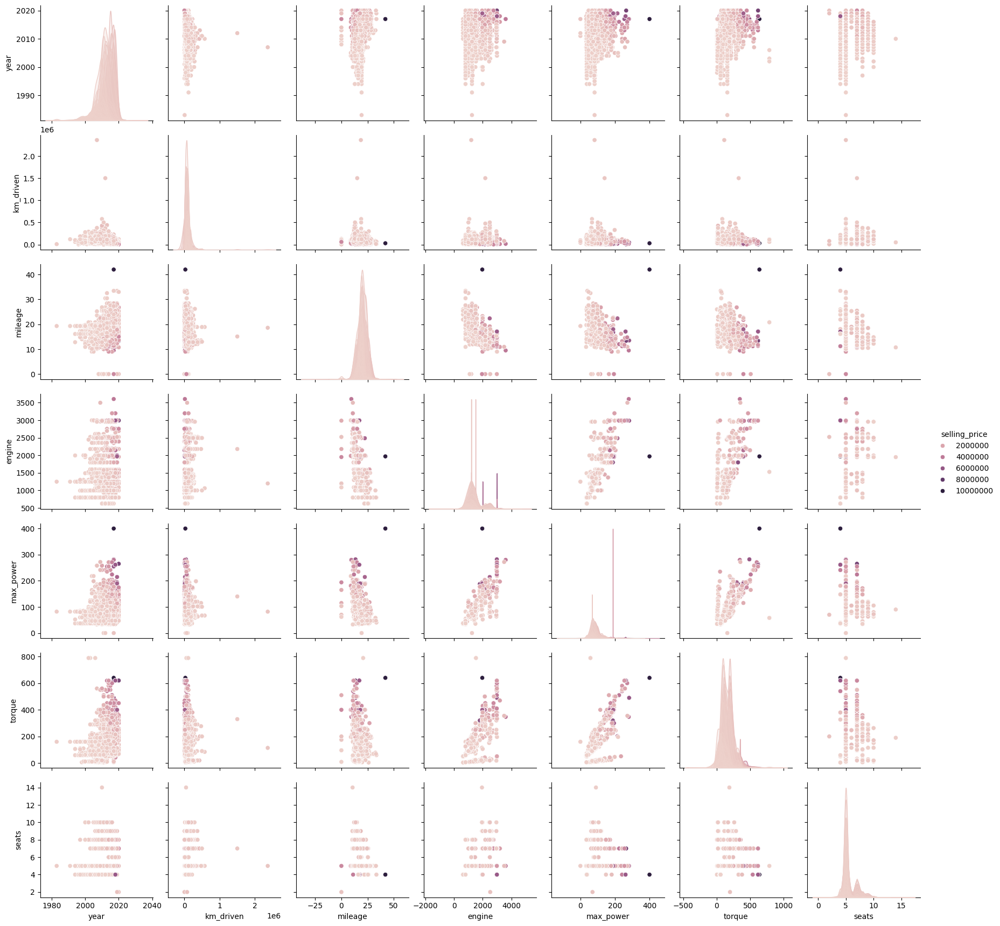

In [ ]:
sns.pairplot(df_train, hue='selling_price')

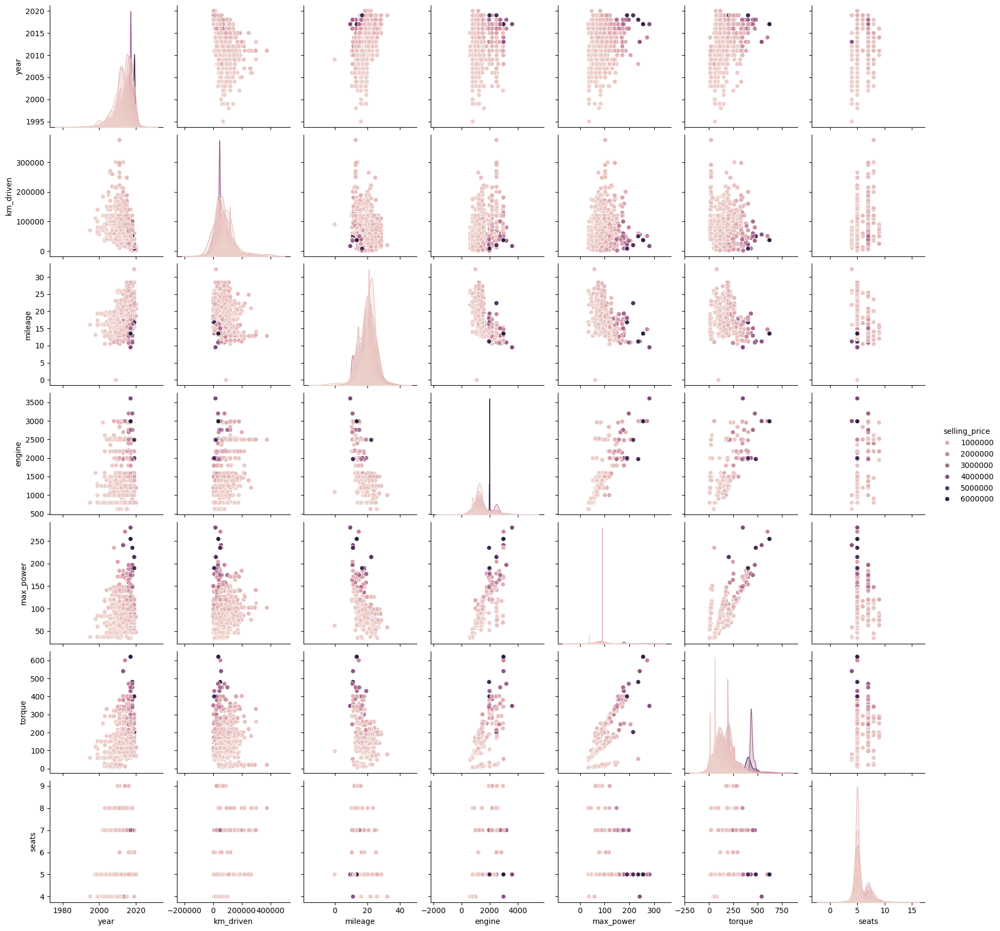

In [ ]:
sns.pairplot(df_test, hue='selling_price')

1. Можно ли предположить на основе распределений связь признаков с целевой переменной?
Да, с помощью графиков pairplot можно визуально определить, отличаются ли распределения признаков для различных значений целевой переменной. Если такие отличия наблюдаются, это может говорить о наличии связи между признаками и целевой переменной. В нашем случае ярко выраженная корреляция таргета прослеживается с колонками year, max_power и engine.
2. Можно ли предположить на основе распределений выдвинуть гипотезу о корреляциях признаков?
Да,  например, max_power и engine, на них видна связь
3. Да, df_train и df_test оказались очень похожими

### **Задание 7 (0.5 балла)**

И так, вы выдвинули гипотезы о наличии связи. Теперь давайте оценим эту связь в числах.

**Задание:**
- [ ] Получите значения коэффициента корреляции Пирсона для тренировочного набора данных при помощи `pd.corr()`
- [ ] По полученным корреляциям постройте тепловую карту (`heatmap` из бибилотеки seaborn)


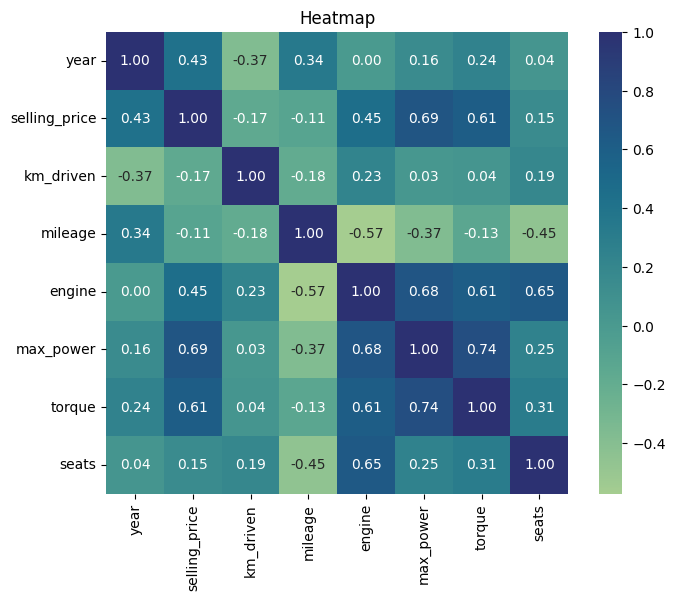

In [35]:
to_int = df_train.select_dtypes(include=[float, int]).columns
correlation_matrix = df_train[to_int].corr()
plt.figure(figsize = (8, 6))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='crest', square=True)
plt.title('Heatmap')
plt.show()

- [ ] Ответьте на вопросы:
 - Какие 2 признака наименее скоррелированы между собой?
 - Между какими наблюдается довольно сильная положительная линейная зависимость?
 - Правильно ли, опираясь на данные, утверждать, что чем меньше год, тем, скорее всего, больше километров проехала машина к дате продажи?

1. Engine и year
2. Сильная положительная зависимость есть у seiling_price и max_power, engine, torque, year
3. Да, это очевидно, а так же подтвеждается данными (корреляция с минусом)

### **Бонус (0.5 балла)**

Если вам кажется, что мы не попросили вас нарисовать какие-то очень важные зависимости, нарисуйте их **и поясните.**

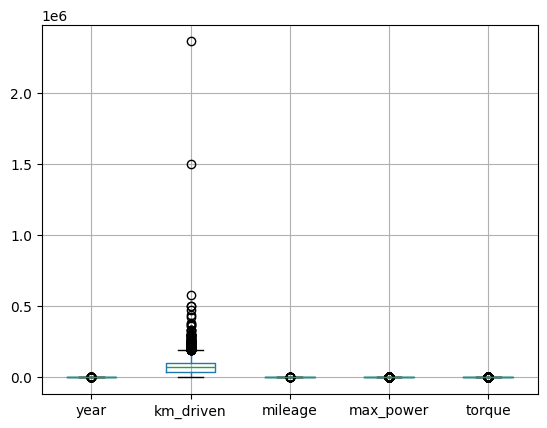

In [36]:
# На выбросы никак не проверяли, а стоило бы
boxplot = df_train.boxplot(column=['year', 'km_driven', 'mileage', 'max_power', 'torque'])

# **Часть 2 | Модель только на вещественных признаках**

В этой части вам предстоит обучить модель только на вещественных признаках. Почему только на них?

Чем больше признаковое пространство — чем сложнее модель. А чем модель проще — тем лучше для скорости работы и интерпретации признаков.

За задания этой части вы можете набрать 1.25 балла;

### **Задание 8 (0.05 балла)**

Разбейте данные на тренировочный и тестовый наборы. Перед разбиением создайте копию датафрейма, который будет хранить только вещественные признаки и используйте его (то есть категориальные столбцы (все, кроме seats) необходимо удалить).

В переменные y_train и y_test запишите значения целевых переменных.

In [37]:
sett = df_train.select_dtypes(exclude='object').columns
df_sett_train = df_train[sett].copy()
df_sett_test = df_test[sett].copy()
df_sett_train.head()

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats
0,2014,450000,145500,23.400000,1248,74.000000,190.0,5
1,2014,370000,120000,21.139999,1498,103.519997,250.0,5
2,2010,225000,127000,23.000000,1396,90.000000,22.0,5
3,2007,130000,120000,16.100000,1298,88.199997,11.0,5
4,2017,440000,45000,20.139999,1197,81.860001,113.0,5


In [38]:
y_train = df_sett_train['selling_price']
x_train = df_sett_train.drop('selling_price',axis=1)

In [39]:
x_train

,year,km_driven,mileage,engine,max_power,torque,seats
0,2014,145500,23.400000,1248,74.000000,190.0,5
1,2014,120000,21.139999,1498,103.519997,250.0,5
2,2010,127000,23.000000,1396,90.000000,22.0,5
3,2007,120000,16.100000,1298,88.199997,11.0,5
4,2017,45000,20.139999,1197,81.860001,113.0,5
...,...,...,...,...,...,...,...
6992,2008,191000,17.920000,1086,62.099998,96.0,5
6993,2013,50000,18.900000,998,67.099998,90.0,5
6994,2013,110000,18.500000,1197,82.849998,113.0,5
6995,2007,119000,16.799999,1493,110.000000,24.0,5


In [40]:
y_test = df_sett_test['selling_price']
x_test = df_sett_test.drop('selling_price',axis=1)

In [41]:
x_test

,year,km_driven,mileage,engine,max_power,torque,seats
0,2010,168000,14.000000,2498.0,112.000000,260.0,7.0
1,2017,25000,21.500000,1497.0,108.500000,260.0,5.0
2,2007,218463,12.900000,1799.0,130.000000,172.0,5.0
3,2015,173000,25.100000,1498.0,98.599998,200.0,5.0
4,2011,70000,16.500000,1172.0,65.000000,96.0,5.0
...,...,...,...,...,...,...,...
995,2008,100000,19.809999,1086.0,68.050003,99.0,5.0
996,2017,50000,18.600000,1197.0,81.830002,114.0,5.0
997,2009,40000,23.000000,1396.0,90.000000,22.0,5.0
998,2012,25000,20.360001,1197.0,78.900002,111.0,5.0


### **Задание 9 (0.2 балла)**

Построим нашу первую модель!
- [ ] Обучите классическую линейную регрессию с дефолтными параметрами. Посчтитайте $R^2$ и $MSE$ для трейна и для теста.
- [ ] Сделайте выводы по значениям метрик качества.

**Примечание:**

Здесь и далее $R^2$ и $MSE$ для трейна и для теста выводите везде, где требуется обучать модели, даже если в явном виде этого не просят. Иначе непонятно, как понять, насколько успешны наши эксперименты.

In [42]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error as MSE

In [43]:
model = LinearRegression()
model.fit(x_train,y_train)

LinearRegression()

In [44]:
y_train_pred_len = model.predict(x_train)
y_test_pred_len = model.predict(x_test)

train_mse = MSE(y_train, y_train_pred_len)
test_mse = MSE(y_test,y_test_pred_len)

train_r2 = r2_score(y_train, y_train_pred_len)
test_r2 = r2_score(y_test,y_test_pred_len)

In [45]:
print(f'Train MSE: {train_mse}')
print(f'Test  MSE: {test_mse}')
print(f'Train  r2: {train_r2}')
print(f'Test   r2: {test_r2}')

Train MSE: 114960791509.0419
Test  MSE: 230546189945.5259
Train  r2: 0.5965446524343885
Test   r2: 0.598930519919169


### **Задание 10 (0.15 балла)**

Всегда есть место совершенству. Поэтому давайте попробуем улучшить модель. При помощи стандартизации признаков.

- [ ] Стандартизируйте значения в тренировочных и тестовых данных. Стандартизатор **обучайте только на `train`**.

In [95]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

In [96]:
scaler.fit(x_train)
x_train_scaled = scaler.transform(x_train)
x_test_scaled = scaler.transform(x_test)

In [97]:
model = LinearRegression()
model.fit(x_train_scaled,y_train)

y_train_pred_stand = model.predict(x_train_scaled)
y_test_pred_stand = model.predict(x_test_scaled)

train_mse = MSE(y_train, y_train_pred_stand)
test_mse = MSE(y_test,y_test_pred_stand)

train_r2 = r2_score(y_train, y_train_pred_stand)
test_r2 = r2_score(y_test,y_test_pred_stand)

In [98]:
print(f'Train MSE: {train_mse}')
print(f'Test  MSE: {test_mse}')
print(f'Train  r2: {train_r2}')
print(f'Test   r2: {test_r2}')

Train MSE: 114960791509.04205
Test  MSE: 230546189945.52383
Train  r2: 0.596544652434388
Test   r2: 0.5989305199191726


### **Задание 11 (0.1 балла)**

Хотя стандартизация не помогла сильно прибавить в качестве она открыла возможность интерпретировать важность признаков в модели. Правило интерпретации такое:

Чем больше коэффициент $\beta_i$ по модулю, тем важнее признак.

**Ответьте на вопрос:**

- [ ] Какой признак оказался наиболее информативным в предсказании цены?

In [99]:
coefs = model.coef_
top_feat = pd.Series(coefs, index=x_train.columns)

In [100]:
top_feat

,0
year,149172.168931
km_driven,-45802.171029
mileage,5318.223785
engine,38912.744984
max_power,275619.634948
torque,72684.795895
seats,-30220.628330


Топчиком оказался max_power, потом year и torque

### **Задание 12 (0.25 балла)**

Попробуем улучшить нашу модель с помощью применения регуляризации. Для этого воспльзуемся `Lasso` регрессией.  Кроме того, попробуйте использовать её теоретическое свойство отбора признаков, за счет зануления незначимых коэффициентов.

**Задание:**

- [ ] Обучите Lasso регрессию на тренировочном наборе данных с нормализованными признаками. Оцените её качество
- [ ] Проверьте, занулила ли L1-регуляризация с параметрами по умолчанию какие-нибудь веса? Предположите почему.

In [103]:
from sklearn.linear_model import Lasso

In [104]:
lasso = Lasso(random_state=42)

In [105]:
lasso.fit(x_train_scaled, y_train)

Lasso(random_state=42)

In [106]:
y_lasso_train_pred = lasso.predict(x_train_scaled)
train_mse = MSE(y_train, y_lasso_train_pred)
train_r2 = r2_score(y_train, y_lasso_train_pred)

print(f'Трейн MSE: {train_mse}')
print(f'Трейн r2: {train_r2}')

Трейн MSE: 114960791518.24677
Трейн r2: 0.596544652402084


In [107]:
y_lasso_test_pred = lasso.predict(x_test_scaled)
test_mse = MSE(y_test, y_lasso_test_pred)
test_r2 = r2_score(y_test, y_lasso_test_pred)

print(f'Тест MSE: {test_mse}')
print(f'Тест r2: {test_r2}')

Тест MSE: 230546878149.6459
Тест r2: 0.5989293226854664


In [108]:
coefs = lasso.coef_
top_feat = pd.Series(coefs, index=x_train.columns)

In [109]:
top_feat

,0
year,149171.997242
km_driven,-45801.090388
mileage,5316.273754
engine,38908.210793
max_power,275620.026091
torque,72685.216765
seats,-30217.980372


Регуляризация не занулила фичи, скорее всего потому, что у всех фичей есть значительный вес, ну и их совсем не много

### **Задание 13 Финальный рывок (0.5 балла)**

До этого мы с вами использовали `train` для обучения и `test` для прогнозирования. Но у нас есть ещё одна задача — подобрать оптимальные параметры модели. Для этого используем кросс-валидацию, описанную на семинарах.

Кроме того, выжмем максимум из модификаций регрессии. Построим `ElasticNet`. И сделаем всё по порядку.

**Ваша задача 1:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для Lasso-регрессии. Вам пригодится класс [GridSearchCV](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html).
- [ ] Ответьте на вопросы:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Какой коэффициент регуляризации у лучшей из перебранных моделей? Занулились ли какие-нибудь из весов при такой регуляризации?

In [136]:
from sklearn.model_selection import GridSearchCV

lasso = Lasso(random_state = 42)

param_grid = {'alpha': np.logspace(-3, 5, 20)}

grid_search = GridSearchCV(estimator=lasso, param_grid=param_grid, cv=10, scoring='r2', n_jobs=-1)
grid_search.fit(x_train_scaled, y_train)

best_alpha = grid_search.best_params_['alpha']
best_model = grid_search.best_estimator_

In [137]:
print("Коэффициенты лучшей модели:")
print(best_alpha)

Коэффициенты лучшей модели:
37926.90190732246


In [138]:
best_model

Lasso(alpha=37926.90190732246, random_state=42)

In [143]:
np.logspace(-3, 5, 20)

array([1.00000000e-03, 2.63665090e-03, 6.95192796e-03, 1.83298071e-02,
       4.83293024e-02, 1.27427499e-01, 3.35981829e-01, 8.85866790e-01,
       2.33572147e+00, 6.15848211e+00, 1.62377674e+01, 4.28133240e+01,
       1.12883789e+02, 2.97635144e+02, 7.84759970e+02, 2.06913808e+03,
       5.45559478e+03, 1.43844989e+04, 3.79269019e+04, 1.00000000e+05])

In [140]:
coefficients = best_model.coef_

In [141]:
coefficients

array([129303.45332378, -12154.73254267,      0.        ,      0.        ,
       268561.45065523,  57200.24246458,     -0.        ])

In [144]:
lasso = Lasso(alpha = 37926.90190732246, random_state=42)
lasso.fit(x_train_scaled, y_train)

y_train_pred_lassogrid = lasso.predict(x_train_scaled)
y_test_pred_lassogrid = lasso.predict(x_test_scaled)

train_mse = MSE(y_train, y_train_pred_lassogrid)
test_mse = MSE(y_test,y_test_pred_lassogrid)

train_r2 = r2_score(y_train, y_train_pred_lassogrid)
test_r2 = r2_score(y_test,y_test_pred_lassogrid)

print(f'Трейн MSE: {train_mse}')
print(f'Тест MSE: {test_mse}')
print(f'Трейн r2: {train_r2}')
print(f'Тест r2: {test_r2}')

Трейн MSE: 118947357141.3324
Тест MSE: 255832267016.77057
Трейн r2: 0.582553784751102
Тест r2: 0.5549416177965871


1. Гридсерчу пришлось обучить 200 моделей
2. Лучший коэф. = 37926.90190732246. Есть занулившиеся веса, скорее всего это связано с высоким значением alpha

**Ваша задача 2:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для [ElasticNet](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.ElasticNet.html) регрессии.
- [ ] Ответьте на вопрос:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Какие гиперпараметры соответствуют лучшей (по выбранной метрике качества) из перебранных моделей?

In [145]:
from sklearn.linear_model import ElasticNet
elastic_net = ElasticNet(random_state = 42)

param_grid = {
    'alpha': np.logspace(-3, 5, 20),
    'l1_ratio': np.linspace(0, 1, 10)
}

grid_search = GridSearchCV(
    estimator = elastic_net,
    param_grid = param_grid,
    cv = 10,
    scoring = 'r2',
    n_jobs = -1
)

grid_search.fit(x_train_scaled, y_train)
best_alpha = grid_search.best_params_['alpha']
best_l1_ratio = grid_search.best_params_['l1_ratio']
print(f"alpha: {best_alpha}")
print(f"l1_ratio: {best_l1_ratio}")

alpha: 0.3359818286283781
l1_ratio: 0.5555555555555556


In [147]:
from sklearn.linear_model import ElasticNet
ElasticNet = ElasticNet(alpha = 0.3359818286283781, l1_ratio = 0.5555555555555556, random_state = 42)
ElasticNet.fit(x_train_scaled, y_train)

y_train_pred_ElasticNet=ElasticNet.predict(x_train_scaled)
y_test_pred_ElasticNet=ElasticNet.predict(x_test_scaled)

train_mse = MSE(y_train, y_train_pred_ElasticNet)
test_mse=MSE(y_test,y_test_pred_ElasticNet)

train_r2 = r2_score(y_train, y_train_pred_ElasticNet)
test_r2=r2_score(y_test,y_test_pred_ElasticNet)

print(f'Трейн MSE: {train_mse}')
print(f'Тест MSE: {test_mse}')
print(f'Трейн r2: {train_r2}')
print(f'Тест r2: {test_r2}')

Трейн MSE: 116718568456.89073
Тест MSE: 245962623995.7725
Трейн r2: 0.5903757273589083
Тест r2: 0.5721113337478696


# **Часть 3| Добавляем категориальные фичи**

Попробуем для улучшения модели дать ей больше признаков. Добавим категориальные фичи.

За эту часть можно набрать 0.75 основных балла и 0.25 бонусных.


### **Задание 14 (0.1 балла)** Проанализируйте столбец `name`. Очевидно, что эта переменная является категориальной, однако категорий в ней много.

В этом домашнем задании мы предлагаем удалить его.

**Ваша задача:**
- [ ] Удалить столбец`name`

In [63]:
df_train_part3 = df_train.copy()
df_test_part3 = df_test.copy()

In [64]:
df_train_part3 = df_train_part3.drop('name',axis=1)
df_test_part3 = df_test_part3.drop('name',axis=1)

В другом случае, конечно, мы могли бы предобработать данный столбец. В качестве бонуса предлагаем вам придумать и реализовать алгоритм предобработки.

### **Бонус 0.5 балла**
- [ ] Предобработайте столбец `name`, чтобы избежать его удаления

In [65]:
from sklearn.preprocessing import LabelEncoder

In [66]:
df_train_part3.describe(include='object')

,fuel,seller_type,transmission,owner
count,6014,6014,6014,6014
unique,4,3,2,5
top,Diesel,Individual,Manual,First Owner
freq,3269,5394,5505,3721


In [67]:
x_train_name = df_train.drop('selling_price',axis=1)
y_train_name = df_train['selling_price']

In [68]:
label_encoder = LabelEncoder()
x_train_name['name']=label_encoder.fit_transform(x_train_name['name'])

In [69]:
x_train_name.shape

(6014, 12)

### **Задание 15 (0.4 балла)**

- [ ] Закодируйте категориалльные фичи и ``seats`` методом OneHot-кодирования. Обратите внимание, что во избежание мультиколлинеарности следует избавиться от одного из полученных столбцов при кодировании каждого признака методом OneHot.

In [70]:
from sklearn.preprocessing import OneHotEncoder

In [71]:
df_train_part3.select_dtypes(include='object')

,fuel,seller_type,transmission,owner
0,Diesel,Individual,Manual,First Owner
1,Diesel,Individual,Manual,Second Owner
2,Diesel,Individual,Manual,First Owner
3,Petrol,Individual,Manual,First Owner
4,Petrol,Individual,Manual,First Owner
...,...,...,...,...
6992,Petrol,Individual,Manual,First Owner
6993,Petrol,Individual,Manual,Second Owner
6994,Petrol,Individual,Manual,First Owner
6995,Diesel,Individual,Manual,Fourth & Above Owner


In [72]:
df_test_part3.select_dtypes(include='object')

,fuel,seller_type,transmission,owner
0,Diesel,Individual,Manual,First Owner
1,Diesel,Individual,Manual,First Owner
2,Petrol,Individual,Automatic,First Owner
3,Diesel,Individual,Manual,First Owner
4,Petrol,Individual,Manual,Second Owner
...,...,...,...,...
995,Petrol,Individual,Manual,Second Owner
996,Petrol,Individual,Manual,Second Owner
997,Diesel,Individual,Manual,First Owner
998,Petrol,Individual,Manual,First Owner


In [73]:
df = pd.concat([df_train_part3, df_test_part3], ignore_index=True)

In [74]:
df

,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.400000,1248.0,74.000000,190.0,5.0
1,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.139999,1498.0,103.519997,250.0,5.0
2,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.000000,1396.0,90.000000,22.0,5.0
3,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.100000,1298.0,88.199997,11.0,5.0
4,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.139999,1197.0,81.860001,113.0,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...
7009,2008,250000,100000,Petrol,Individual,Manual,Second Owner,19.809999,1086.0,68.050003,99.0,5.0
7010,2017,440000,50000,Petrol,Individual,Manual,Second Owner,18.600000,1197.0,81.830002,114.0,5.0
7011,2009,340000,40000,Diesel,Individual,Manual,First Owner,23.000000,1396.0,90.000000,22.0,5.0
7012,2012,350000,25000,Petrol,Individual,Manual,First Owner,20.360001,1197.0,78.900002,111.0,5.0


In [75]:
cat_columns = ['fuel', 'seller_type', 'transmission', 'owner', 'seats']

encoder = OneHotEncoder(drop='first', sparse_output=False)

encoded_array = encoder.fit_transform(df[cat_columns])

encoded_columns = encoder.get_feature_names_out(cat_columns)
encoded_df = pd.DataFrame(encoded_array, columns=encoded_columns)

numerical_columns = df.drop(columns=cat_columns)
df_comb_encoded = pd.concat([numerical_columns.reset_index(drop=True), encoded_df.reset_index(drop=True)], axis=1)

train_rows = 6014
test_rows = 1000

train_encoded = df_comb_encoded.iloc[:train_rows].reset_index(drop=True)
test_encoded = df_comb_encoded.iloc[train_rows:].reset_index(drop=True)

In [76]:
train_encoded

,year,selling_price,km_driven,mileage,engine,max_power,torque,fuel_Diesel,fuel_LPG,fuel_Petrol,...,owner_Test Drive Car,owner_Third Owner,seats_4.0,seats_5.0,seats_6.0,seats_7.0,seats_8.0,seats_9.0,seats_10.0,seats_14.0
0,2014,450000,145500,23.400000,1248.0,74.000000,190.0,1.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2014,370000,120000,21.139999,1498.0,103.519997,250.0,1.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2010,225000,127000,23.000000,1396.0,90.000000,22.0,1.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2007,130000,120000,16.100000,1298.0,88.199997,11.0,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
4,2017,440000,45000,20.139999,1197.0,81.860001,113.0,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6009,2008,120000,191000,17.920000,1086.0,62.099998,96.0,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
6010,2013,260000,50000,18.900000,998.0,67.099998,90.0,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
6011,2013,320000,110000,18.500000,1197.0,82.849998,113.0,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
6012,2007,135000,119000,16.799999,1493.0,110.000000,24.0,1.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


In [77]:
test_encoded

,year,selling_price,km_driven,mileage,engine,max_power,torque,fuel_Diesel,fuel_LPG,fuel_Petrol,...,owner_Test Drive Car,owner_Third Owner,seats_4.0,seats_5.0,seats_6.0,seats_7.0,seats_8.0,seats_9.0,seats_10.0,seats_14.0
0,2010,229999,168000,14.000000,2498.0,112.000000,260.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1,2017,665000,25000,21.500000,1497.0,108.500000,260.0,1.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2007,175000,218463,12.900000,1799.0,130.000000,172.0,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2015,635000,173000,25.100000,1498.0,98.599998,200.0,1.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
4,2011,130000,70000,16.500000,1172.0,65.000000,96.0,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,2008,250000,100000,19.809999,1086.0,68.050003,99.0,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
996,2017,440000,50000,18.600000,1197.0,81.830002,114.0,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
997,2009,340000,40000,23.000000,1396.0,90.000000,22.0,1.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
998,2012,350000,25000,20.360001,1197.0,78.900002,111.0,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


### **Задание 16 (0.25 балла)**
Повторим то, что делали на прошлом шаге для моделей на вещественных признаках, однако теперь с моделью `Ridge`.


**Ваша задача:**
- [ ] Переберите параметр регуляризации `alpha` для гребневой (ridge) регрессии с помощью класса `GridSearchCV` В качестве параметров при объявлении GridSearchCV кроме модели укажите метрику качества $R^2$. Кроссвалидируйтесь по 10-ти фолдам.
- [ ] Ответье на вопрос: Удалось ли улучшить качество прогнозов?

In [78]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV

In [79]:
train_encodeX = train_encoded.drop('selling_price',axis=1)
train_encodeY = train_encoded['selling_price']
test_encodeX = test_encoded.drop('selling_price',axis=1)
test_encodeY = test_encoded['selling_price']

In [153]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV
Ridgeeee_net = Ridge(random_state = 42)

param_grid = {
    'alpha': np.logspace(-3, 5, 20),
}

grid_search = GridSearchCV(
    estimator=Ridgeeee_net,
    param_grid=param_grid,
    cv=10,
    scoring='r2',
    n_jobs=-1
)

grid_search.fit(train_encodeX, train_encodeY)
best_alpha = grid_search.best_params_['alpha']
print(f"alpha: {best_alpha}")

alpha: 6.158482110660261


In [154]:
Ridgeee = Ridge(alpha=6.158482110660261, random_state = 42)
Ridgeee.fit(train_encodeX, train_encodeY)

y_train_pred_Ridgeee=Ridgeee.predict(train_encodeX)
y_test_pred_Ridgeee=Ridgeee.predict(test_encodeX)

train_mse = MSE(train_encodeY, y_train_pred_Ridgeee)
test_mse=MSE(test_encodeY, y_test_pred_Ridgeee)

train_r2 = r2_score(train_encodeY, y_train_pred_Ridgeee)
test_r2=r2_score(test_encodeY, y_test_pred_Ridgeee)

print(f'Трейн MSE: {train_mse}')
print(f'Тест MSE: {test_mse}')
print(f'Трейн r2: {train_r2}')
print(f'Тест r2: {test_r2}')

Трейн MSE: 97291642720.55199
Тест MSE: 202178834152.90552
Трейн r2: 0.6585545992351463
Тест r2: 0.6482797659062853


# **Часть 4. | Бизнесовая (0.5 балла)**

### **Задание 17 (0.5 балла)**

В мире бизнеса очень важно давать оценку качества модели понятную бизнесу, поэтому иногда заказчики приходят с кастомными метриками. Попробуем сделать такую для нашей задачи.

**Описание метрики:**

Среди всех предсказанных цен на авто нужно посчитать долю прогнозов, отличающихся от реальных цен на эти авто не более чем на 10% (в одну или другую сторону)

**Ваша задача:**

- [ ] Реализуйте метрику `business_metric`
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какаю лучше всего решает задачу бизнеса

In [155]:
def business_metric(y_true, y_pred):
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    relative_error = np.abs(y_pred - y_true) / y_true
    successful_predictions = np.sum(relative_error <= 0.10)
    total_predictions = len(y_true)
    business_metric = successful_predictions / total_predictions
    return business_metric


In [156]:
#LR
business_metric(test_encodeY, y_test_pred_len)

0.231

In [157]:
#LR + стандартизация
business_metric(test_encodeY, y_test_pred_stand)

0.231

In [158]:
#Lasso
business_metric(test_encodeY, y_lasso_test_pred)

0.231

In [159]:
#Lasso + GS
business_metric(test_encodeY, y_test_pred_lassogrid)

0.257

In [160]:
#ElasticNet
business_metric(test_encodeY, y_test_pred_ElasticNet)

0.258

In [161]:
#Ridge
business_metric(test_encodeY, y_test_pred_Ridgee)

0.246

Лучше всех себя показал ElasicNet

# **Часть 5 (3 балла) | Реализация сервиса на FastAPI**

### **Задание 18 (3 балла)**


Cделайте с помощью FastAPI сервис, который с точки зрения пользователя реализует две функции:

1. на вход в формате json подаются признаки одного объекта, на выходе сервис выдает предсказанную стоимость машины
2. на вход подается csv-файл с признаками тестовых объектов, на выходе получаем файл с +1 столбцом - предсказаниями на этих объектах

С точки зрения реализации это означает следующее:
- средствами pydantic должен быть описан класс базового объекта
- класс с коллецией объектов
- метод post, который получает на вход один объект описанного класса
- метод post, который получает на вход коллекцию объектов описанного класса

Шаблон для сервисной части дан ниже. Код необходимо дополнить и оформить в виде отдельного .py-файла.

In [ ]:
from fastapi import FastAPI
from pydantic import BaseModel
from typing import List

app = FastAPI()


class Item(BaseModel):
    name: str
    year: int
    selling_price: int
    km_driven: int
    fuel: str
    seller_type: str
    transmission: str
    owner: str
    mileage: str
    engine: str
    max_power: str
    torque: str
    seats: float


class Items(BaseModel):
    objects: List[Item]


@app.post("/predict_item")
def predict_item(item: Item) -> float:
    return ...


@app.post("/predict_items")
def predict_items(items: List[Item]) -> List[float]:
    return ...

Протестируйте сервис на корректность работы и приложите скриншоты (см. ниже).

# **Часть 6 (1 балл) | Оформление результатов**

### **Задание 19 (1 балл)**


**Результаты вашей работы** необходимо разместить в своем Гитхабе. Под результатами понимаем следующее:
* ``.ipynb``-ноутбук со всеми проведёнными вами экспериментами (output'ы ячеек, разумеется, сохранить)
* сохраненный дашборд в любом формате
* ``.py``-файл с реализацией сервиса
* ``.pickle``-файл с сохранёнными весами модели, коэффициентами скейлинга и прочими числовыми значениями, которые могут понадобиться для инференса
* ``.md``-файл с выводами про проделанной вами работе:
    * что было сделано
    * с какими результатами
    * что дало наибольший буст в качестве
    * что сделать не вышло и почему (это нормально, даже хорошо😀)

**За что могут быть сняты баллы в этом пункте:**
* за отсутствие ``.pickle``-файла с весами использованной модели
* за недостаточную аналитику в ``.md``-файле
* за оформление и логику кода (в определённом смысле это тоже элемент оформления решения)

**Как будет выглядет проверка всего домашнего задания?**
1. Ассистент проходит по ссылке на (**открытый**) репозиторий из Энитаска
2. Смотрит ``readme.md``:
    * пожалуйста, приложите в него же скрины работы вашего сервиса -- собирать ваши проекты довольно времязатратно, но хочется убедиться, что всё работает
    * можете в md-файл приложить ссылку на screencast с демонстрацией
3. Просматривает ноутбук с DS-частью
4. Заглядывает в код сервиса
5. Хвалит

# **Часть Благодарственная**

Надеемся, вы честно проделали все пункты, а не просто пролистали досюда. Потому что здесь награда за старания. Пожалуйста, не стоит награждать себя до того, как закончите работать над домашкой!

<details>
<summary><b>Что-то приятное</b></summary>

**Напоминаем, что нашем курсе действует система кото-бонусов** 🐈

На фото по ссылке — сэр кот кого-то из команды курса (преподаватель, помощник преподавателя, ассистенты).

Предлагаем вам угадать — чей это товарищ!

[Первый кот](https://ibb.co/XbnpCTg)

</details>

